# Stock Market Time Series Analysis

## The Data

The data for this project came from Kaggle and is stock market prices for 31 companies.  The data is in daily increments beginning on 01-03-2006 and ending 12-29-2017.  The only time that increments are not daily is on government declared holidays and weekends.  
The data includes columns containing amounts that represent the following features:

|Column|What it is|
|---|---|
|Date| The day of occurrence.|
|Open| The cost of the individual stock at the time the market opens|
|High| The highest price the stock reached during the day|
|Low| The lowest price the stock reached during the day|
|Close| The price of the individual stock when the market closed that day|
|Volume|Daily trading volume is how many shares are traded per day.|
|Name| The Name is a usually three letter acronym that stands for the company that the stock is for, also known as a ticker mark or ticker symbol|


In [118]:
#imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
 

import itertools
import statsmodels.api as sm
from statsmodels.tsa.arima_model import ARIMA

In [119]:
df = pd.read_csv('all_stocks.csv')

In [120]:
df.shape

(93612, 7)

In [121]:
#initial look
df

,Date,Open,High,Low,Close,Volume,Name
0,2006-01-03,77.76,79.35,77.24,79.11,3117200,MMM
1,2006-01-04,79.49,79.49,78.25,78.71,2558000,MMM
2,2006-01-05,78.41,78.65,77.56,77.99,2529500,MMM
3,2006-01-06,78.64,78.90,77.64,78.63,2479500,MMM
4,2006-01-09,78.50,79.83,78.46,79.02,1845600,MMM
...,...,...,...,...,...,...,...
93607,2017-12-22,71.42,71.87,71.22,71.58,10979165,AABA
93608,2017-12-26,70.94,71.39,69.63,69.86,8542802,AABA
93609,2017-12-27,69.77,70.49,69.69,70.06,6345124,AABA
93610,2017-12-28,70.12,70.32,69.51,69.82,7556877,AABA


In [122]:
df.isnull().sum()

Date       0
Open      25
High      10
Low       20
Close      0
Volume     0
Name       0
dtype: int64

One of the issues that I kept running into was how to deal with the format of date in the data frame.  Here I am trying to convert it to a format that is going to be compatible with the model and the graphs at the end.

In [123]:
df.index = pd.DatetimeIndex(df.Date)

In [124]:
df.head()

,Date,Open,High,Low,Close,Volume,Name
Date,,,,,,,
2006-01-03,2006-01-03,77.76,79.35,77.24,79.11,3117200,MMM
2006-01-04,2006-01-04,79.49,79.49,78.25,78.71,2558000,MMM
2006-01-05,2006-01-05,78.41,78.65,77.56,77.99,2529500,MMM
2006-01-06,2006-01-06,78.64,78.90,77.64,78.63,2479500,MMM
2006-01-09,2006-01-09,78.50,79.83,78.46,79.02,1845600,MMM


In [125]:
df = df.drop('Date', axis=1)

In [126]:
df.head()

,Open,High,Low,Close,Volume,Name
Date,,,,,,
2006-01-03,77.76,79.35,77.24,79.11,3117200,MMM
2006-01-04,79.49,79.49,78.25,78.71,2558000,MMM
2006-01-05,78.41,78.65,77.56,77.99,2529500,MMM
2006-01-06,78.64,78.90,77.64,78.63,2479500,MMM
2006-01-09,78.50,79.83,78.46,79.02,1845600,MMM


In [127]:
#find out all the ticker symbols in this data set.
df['Name'].unique()

array(['MMM', 'AXP', 'AAPL', 'BA', 'CAT', 'CVX', 'CSCO', 'KO', 'DIS',
       'XOM', 'GE', 'GS', 'HD', 'IBM', 'INTC', 'JNJ', 'JPM', 'MCD', 'MRK',
       'MSFT', 'NKE', 'PFE', 'PG', 'TRV', 'UTX', 'UNH', 'VZ', 'WMT',
       'GOOGL', 'AMZN', 'AABA'], dtype=object)

Not knowing all of the ticker symbols by heart I created a data set that showed exactly what each ticker symbol is

In [128]:
#create a df that decodes all of the ticker symbols and categorize them by industry.
df_ticker = pd.read_csv('Ticker Symbols.csv')
df_ticker

,Ticker,Company,Industry
0,MMM,3M,commerece
1,AXP,American Express,finance
2,AAPL,Apple,tech
3,BA,Boeing,transportation
4,CAT,Caterpillar,construction
5,CVX,Chevron,energy
6,CSCO,Cisco,tech
7,KO,Coca Cola,food/bev
8,DIS,Disney,entertainment
9,XOM,exxon mobile,energy


### Data Visualization

In [129]:
import plotly.express as px

fig = px.line(df, x=df.index, y="Close", color = 'Name', title='10 Year Stock Market')
fig.show()

In [130]:
df_1 = df[~df.Name.str.contains("AMZN")]

In [131]:
fig = px.line(df_1, x=df_1.index, y="Close", color = 'Name', title='10 Year Stock Market')
fig.show()

In [132]:
df_amzn = df[df.Name.str.contains("AMZN")]
df_googl = df[df.Name.str.contains("GOOGL")]

In [133]:
fig = px.line(df_amzn, x=df_amzn.index, y="Close", title='Amazon 10 Year Stock Market')
fig.show()

In [134]:
fig = px.line(df_googl, x=df_googl.index, y="Close", title='Amazon 10 Year Stock Market')
fig.show()

### Missing Values

In [135]:
df.isna().sum()

Open      25
High      10
Low       20
Close      0
Volume     0
Name       0
dtype: int64

In [136]:
df = df.dropna()

In [137]:
df.isna().sum()

Open      0
High      0
Low       0
Close     0
Volume    0
Name      0
dtype: int64

## Stationarity Check

Stationarity is an important concept in the field of time series analysis with tremendous influence on how the data is perceived and predicted. When forecasting or predicting the future, most time series models assume that each point is independent of one another. The best indication of this is when the dataset of past instances is stationary. For data to be stationary, the statistical properties of a system do not change over time. This does not mean that the values for each data point have to be the same, but the overall behavior of the data should remain constant. From a purely visual assessment, time plots that do not show trends or seasonality can be considered stationary. More numerical factors in support of stationarity include a constant mean and a constant variance.

-Towards Data Science

Rolling Mean:
Rolling means (or moving averages) are generally used to smooth out short-term fluctuations in time series data and highlight long-term trends. 
-Data Camp

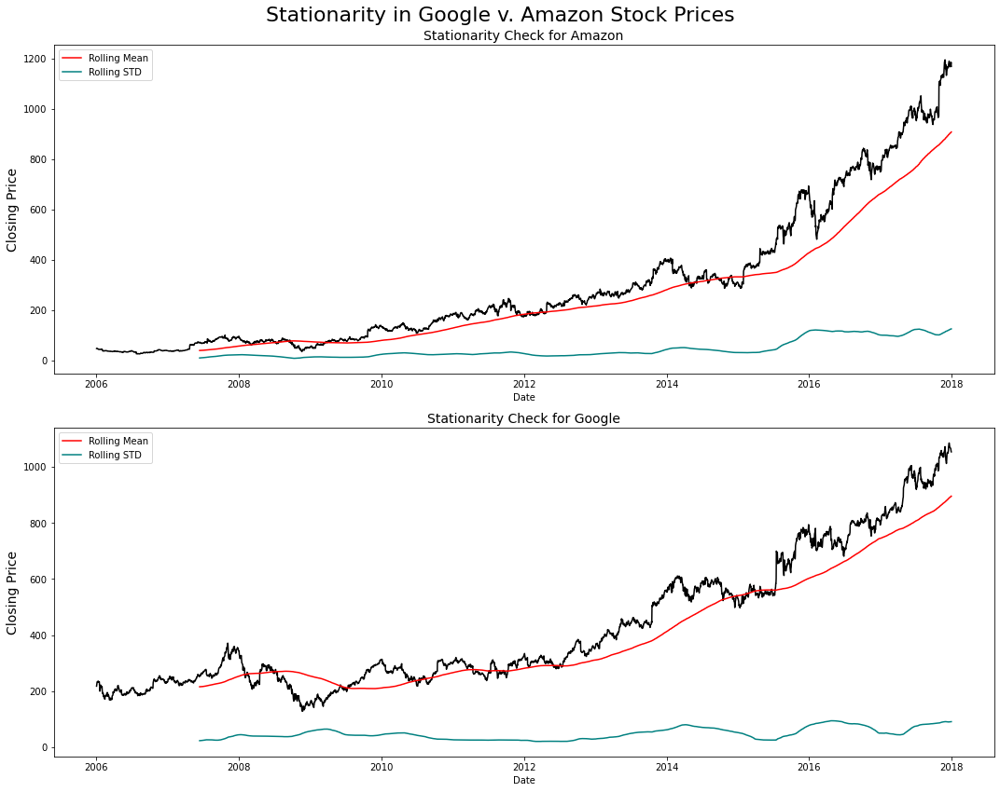

In [138]:
rolling_window = 365
f, ax = plt.subplots(nrows=2, ncols=1, figsize=(15, 12))
f.suptitle('Stationarity in Google v. Amazon Stock Prices', fontsize=22)

sns.lineplot(x=df_amzn.index, y=df_amzn['Close'], ax=ax[0], color='black')
sns.lineplot(x=df_amzn.index, y=df_amzn['Close'].rolling(rolling_window).mean(), ax=ax[0], color='red', label='Rolling Mean')
sns.lineplot(x=df_amzn.index, y=df_amzn['Close'].rolling(rolling_window).std(), ax=ax[0], color='teal', label='Rolling STD')
ax[0].set_title('Stationarity Check for Amazon', fontsize=14)
ax[0].set_ylabel(ylabel='Closing Price', fontsize=14)

sns.lineplot(x=df_googl.index, y=df_googl['Close'], ax=ax[1], color='black')
sns.lineplot(x=df_googl.index, y=df_googl['Close'].rolling(rolling_window).mean(), ax=ax[1], color='red', label='Rolling Mean')
sns.lineplot(x=df_googl.index, y=df_googl['Close'].rolling(rolling_window).std(), ax=ax[1], color='teal', label='Rolling STD')
ax[1].set_title('Stationarity Check for Google', fontsize=14)
ax[1].set_ylabel(ylabel='Closing Price', fontsize=14)

plt.tight_layout()
plt.show()

There doesnt appear to be evidence of stationarity visually, meaning we have seasonallity.

## New df

In [139]:
new_df = df_googl.filter(['Close'], axis=1)

In [140]:
new_df.head()

,Close
Date,
2006-01-03,217.83
2006-01-04,222.84
2006-01-05,225.85
2006-01-06,233.06
2006-01-09,233.68


### Dickey-Fuller Test

In [141]:
# https://www.statsmodels.org/stable/generated/statsmodels.tsa.stattools.adfuller.html
from statsmodels.tsa.stattools import adfuller

result = adfuller(new_df['Close'].values)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

ADF Statistic: 1.322424
p-value: 0.996732
Critical Values:
	1%: -3.433
	5%: -2.863
	10%: -2.567


An Augmented Dickey Fuller test was conducted. The hypothesis of this test are 𝐻0: "Process has unit root" vs. 𝐻a: "Process has no unit root". The test statistic is 1.322424. Now you need to compare this with the critical values under 𝐻0. The critical values are given with:

1%:−3.433\
5%:−2.863\
10%:−2.567

Since your test statistic is higher than all of the critical values you fail to reject 𝐻0 at a significance level > 0.05. So you also fail conclude that your time series has no unit root. Statistically speaking, your process has a unit root and is not stationary. So, you fail reject 𝐻0.

In [144]:
# This function came from: https://www.kaggle.com/iamleonie.

def visualize_adfuller_results(series, title, ax):
    result = adfuller(series)
    significance_level = 0.05
    adf_stat = result[0]
    p_val = result[1]
    crit_val_1 = result[4]['1%']
    crit_val_5 = result[4]['5%']
    crit_val_10 = result[4]['10%']

    if (p_val < significance_level) & ((adf_stat < crit_val_1)):
        linecolor = 'forestgreen' 
    elif (p_val < significance_level) & (adf_stat < crit_val_5):
        linecolor = 'orange'
    elif (p_val < significance_level) & (adf_stat < crit_val_10):
        linecolor = 'red'
    else:
        linecolor = 'purple'
    sns.lineplot(x=df_googl.index, y=series, ax=ax, color=linecolor)
    ax.set_title(f'ADF Statistic {adf_stat:0.3f}, p-value: {p_val:0.3f}\nCritical Values 1%: {crit_val_1:0.3f}, 5%: {crit_val_5:0.3f}, 10%: {crit_val_10:0.3f}', fontsize=14)
    ax.set_ylabel(ylabel=title, fontsize=14)

<AxesSubplot:xlabel='Close', ylabel='Count'>

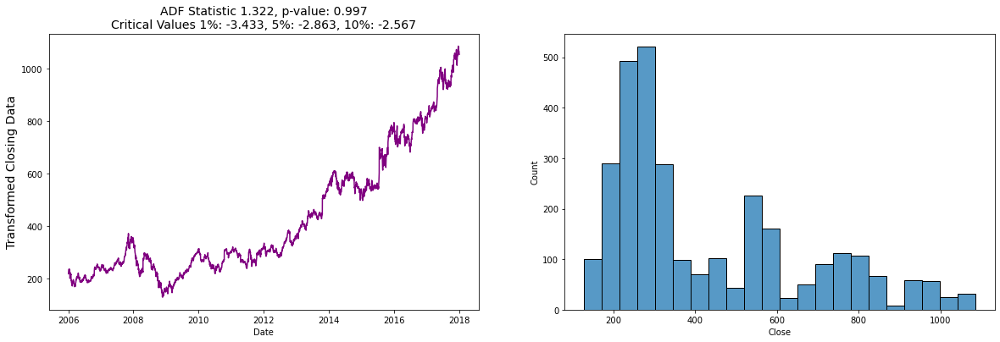

In [145]:
f, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 6))
visualize_adfuller_results(new_df['Close'], 'Transformed Closing Data', ax[0])

sns.histplot(new_df['Close'], ax=ax[1])

### Log Transformations

<AxesSubplot:xlabel='Close', ylabel='Count'>

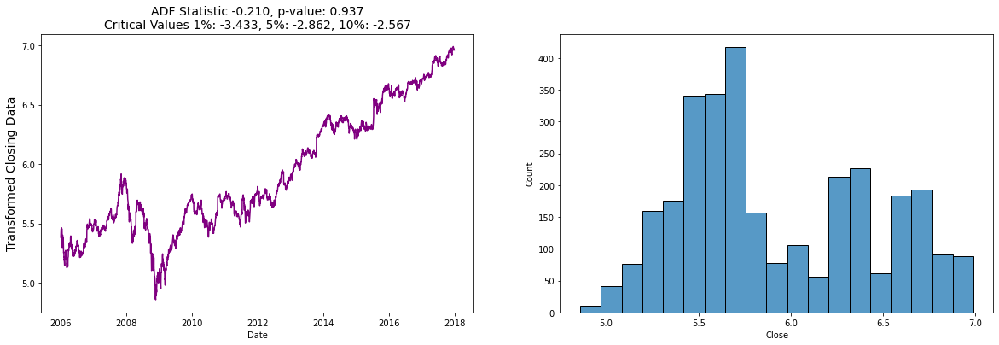

In [146]:
# Log Transform of absolute values
# (Log transoform of negative values will return NaN)
new_df['Close'] = np.log(abs(new_df['Close']))

f, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 6))
visualize_adfuller_results(new_df['Close'], 'Transformed Closing Data', ax[0])

sns.histplot(new_df['Close'], ax=ax[1])

### Differencing 

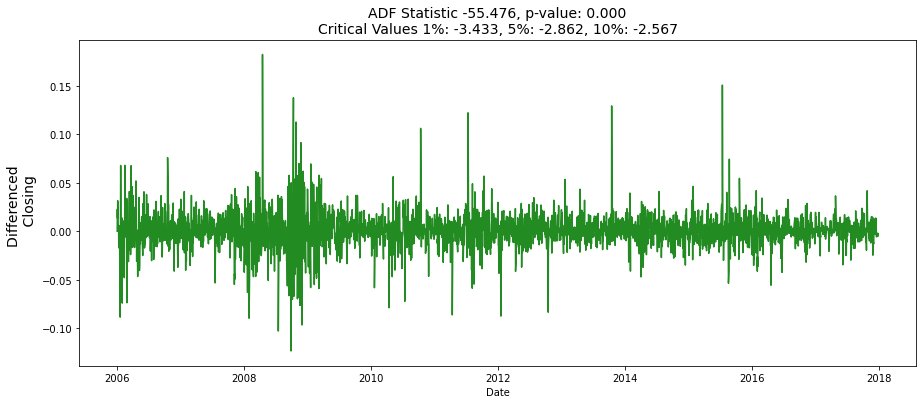

In [147]:
# First Order Differencing
df_diff = np.diff(new_df['Close'])
new_df['Close'] = np.append([0], df_diff)

f, ax = plt.subplots(nrows=1, ncols=1, figsize=(15, 6))
visualize_adfuller_results(new_df['Close'], 'Differenced \n Closing', ax) 



## Time Series Decomposition

Time series decomposition involves thinking of a series as a combination of trend, seasonality, and randomness components.

These components are defined as follows:

Time series decomposition is a mathematical procedure that transforms a time series into multiple different time series. The original time series is often split into three component series:

Seasonal: Patterns that repeat within a fixed period. For example, a website might receive more visits during weekends; this would produce data with a seasonality of 7 days.

Trend: The underlying trend of the metrics. A website increasing in popularity should show a general trend that goes up.

Random: Also called "noise", "irregular", or "remainder", this is the residual of the original time series after the seasonal and trend series are removed.

Decomposition provides a useful abstract model for thinking about time series generally and for better understanding problems during time series analysis and forecasting.

All series have some level of randomness. The trend and seasonality components are optional.

It is helpful to think of the components as combining either additively or multiplicatively:
* **Additive**: y(t) = Trend + Seasonality + Randomness
* **Multiplicative**: y(t) = Trend * Seasonality * Randomness

In [148]:
from statsmodels.tsa.seasonal import seasonal_decompose

core_columns =  ['Close','Open','Volume','High', 'Low']

for column in core_columns:
    decomp = seasonal_decompose(df[column], period=52, model='additive', extrapolate_trend='freq')
    df[f"{column}_trend"] = decomp.trend
    df[f"{column}_seasonal"] = decomp.seasonal

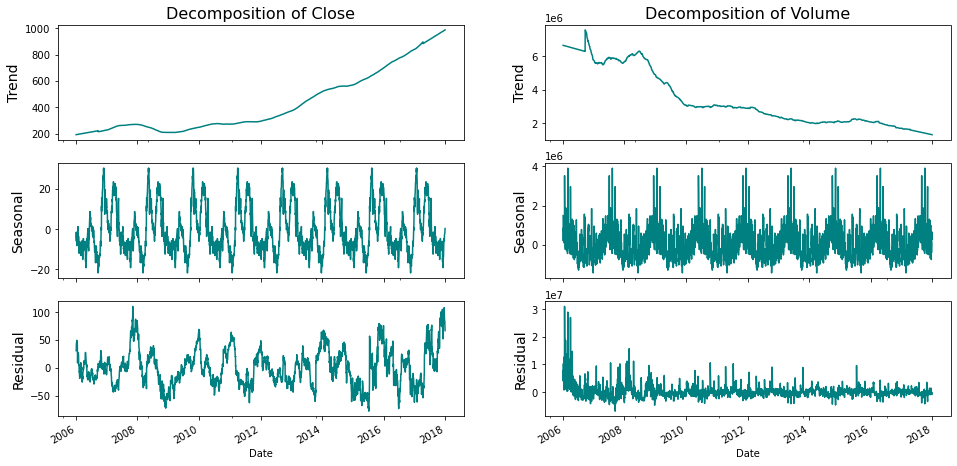

In [149]:
fig, ax = plt.subplots(ncols=2, nrows=3, sharex=True, figsize=(16,8))

for i, column in enumerate(['Close', 'Volume']):
    
    res = seasonal_decompose(df_googl[column], period=365, model='additive', extrapolate_trend='freq')

    ax[0,i].set_title('Decomposition of {}'.format(column), fontsize=16)

    res.trend.plot(ax=ax[0,i], legend=False, color='teal')
    ax[0,i].set_ylabel('Trend', fontsize=14)

    res.seasonal.plot(ax=ax[1,i], legend=False, color='teal')
    ax[1,i].set_ylabel('Seasonal', fontsize=14)
    
    res.resid.plot(ax=ax[2,i], legend=False, color='teal')
    ax[2,i].set_ylabel('Residual', fontsize=14)

plt.show()

## Autocorrelation Analysis

Autocorrelation is the correlation of a variable with itself at differing time lags. 

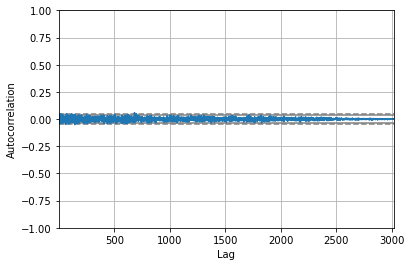

In [150]:
from pandas.plotting import autocorrelation_plot

autocorrelation_plot(new_df['Close'])
plt.show()

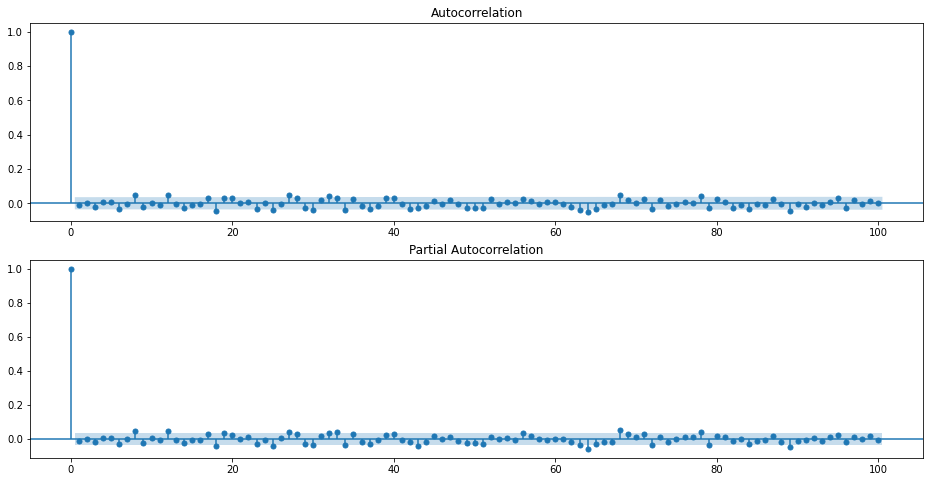

In [151]:
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

f, ax = plt.subplots(nrows=2, ncols=1, figsize=(16, 8))

plot_acf(new_df['Close'], lags=100, ax=ax[0])
plot_pacf(new_df['Close'], lags=100, ax=ax[1])

plt.show()

## Modelling

### Types of Models

|Type of Model|Definition|When is it Useful|
| --- |--- | --- |
|White Noise|A time series is white noise if the variables are independent and identically distributed with a mean of zero.  This means that all variables have the same variance and each value has a zero correlation with all other values in the series.|White noise is an important concept in time series analysis and forecasting. It is important for two main reasons: Predictability: If your time series is white noise, then, by definition, it is random. You cannot reasonably model it and make predictions. Model Diagnostics: The series of errors from a time series forecast model should ideally be white noise.|
|Random Walk|Pure Random Walk (Yt = Yt-1 + εt ) Random walk predicts that the value at time "t" will be equal to the last period value plus a stochastic (non-systematic) component that is a white noise, which means εt is independent and identically distributed with mean "0" and variance "σ²." Random walk can also be named a process integrated of some order, a process with a unit root or a process with a stochastic trend. It is a non-mean-reverting process that can move away from the mean either in a positive or negative direction. Another characteristic of a random walk is that the variance evolves over time and goes to infinity as time goes to infinity; therefore, a random walk cannot be predicted.|Random walk theory suggests that changes in stock prices have the same distribution and are independent of each other. Therefore, it assumes the past movement or trend of a stock price or market cannot be used to predict its future movement.|
|Random Walk w/ Drift|Random walk theory suggests that changes in stock prices have the same distribution and are independent of each other. Therefore, it assumes the past movement or trend of a stock price or market cannot be used to predict its future movement.|hold|
|ARMA|An ARMA model, or Autoregressive Moving Average model, is used to describe weakly stationary stochastic time series in terms of two polynomials. The first of these polynomials is for autoregression, the second for the moving average.|Auto Regression, Moving Average|
|ARIMA|ARIMA is an acronym that stands for AutoRegressive Integrated Moving Average. It is a class of model that captures a suite of different standard temporal structures in time series data.|The I in ARIMA stands for “integrated”, and it has to do with the differencing in time series. This concept is often used for eliminating the trends in time series to make it stationary, and can be better illustrated with some examples of moving trends.|
|SARIMA|Seasonal Autoregressive Integrated Moving Average, or SARIMA, method for time series forecasting with univariate data containing trends and seasonality is an extension to ARIMA that supports the direct modeling of the seasonal component.|Accounts for Seasonality|

### ARIMA Model

The Auto-Regressive Integrated Moving Average (ARIMA) model describes the **autocorrelations** in the data. The model assumes that the time-series is **stationary**. It consists of three main parts:

|p|d|q|
|---|---|---|
|AR|I|MA|
|Auto-Regressive (AR) filter (long term)|Integration filter (stochastic trend)|Moving Average (MA) filter (short term)|

* **Step 1 — Check stationarity**: If a time series has a trend or seasonality component, it must be made stationary before we can use ARIMA to forecast. .
* **Step 2 — Difference**: If the time series is not stationary, it needs to be stationarized through differencing. Take the first difference, then check for stationarity. Take as many differences as it takes. Make sure you check seasonal differencing as well.
* **Step 3 — Filter out a validation sample**: This will be used to validate how accurate our model is. Use train test validation split to achieve this
* **Step 4 — Select AR and MA terms**: Use the ACF and PACF to decide whether to include an AR term(s), MA term(s), or both.
* **Step 5 — Build the model**: Build the model and set the number of periods to forecast to N (depends on your needs).
* **Step 6 — Validate model**: Compare the predicted values to the actuals in the validation sample.

In [152]:
# Define the p, d and q parameters to take any value between 0 and 2
p = d = q = range(0, 2)

# Generate all different combinations of p, q and q triplets
pdq = list(itertools.product(p, d, q))

In [153]:
print(pdq)

[(0, 0, 0), (0, 0, 1), (0, 1, 0), (0, 1, 1), (1, 0, 0), (1, 0, 1), (1, 1, 0), (1, 1, 1)]


In [154]:
#train_test_split
tr_start,tr_end = '2006-01','2014-01'
te_start,te_end = '2014-02','2017-01'
tra = new_df['Close'][tr_start:tr_end].dropna()
tes = new_df['Close'][te_start:te_end].dropna()

In [155]:
new_df.shape

(3019, 1)

In [156]:
X = new_df.values
train = X[0:2500]
test = X[2500:]

In [157]:
train.size

2500

In [158]:
test.size

519

In [159]:
arima = sm.tsa.statespace.SARIMAX(np.asarray(train),order=(0,1,1) ,seasonal_order=(0,0,0,0),enforce_stationarity=False, enforce_invertibility=False,)

In [160]:
output = arima.fit()          

In [161]:
print(output.summary())

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 2500
Model:               SARIMAX(0, 1, 1)   Log Likelihood                6287.681
Date:                Sun, 30 May 2021   AIC                         -12571.362
Time:                        06:27:06   BIC                         -12559.716
Sample:                             0   HQIC                        -12567.133
                               - 2500                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -1.0000      0.143     -7.008      0.000      -1.280      -0.720
sigma2         0.0004   5.46e-05      6.949      0.000       0.000       0.000
Ljung-Box (L1) (Q):                   0.39   Jarque-

In [162]:
predictions = output.forecast(steps = 33)[0]
predictions

0.0006825356569731488

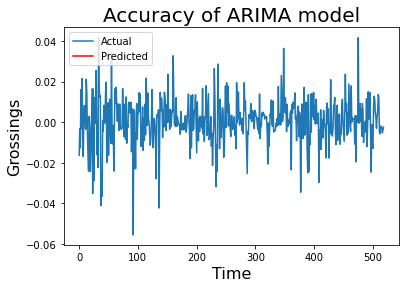

In [163]:
plt.plot(test, label = 'Actual')
plt.plot(predictions, color='red', label = 'Predicted')
plt.legend(loc='upper left')

plt.title("Accuracy of ARIMA model", fontsize=20)
plt.xlabel("Time", fontsize=16)
plt.ylabel("Grossings", fontsize=16)

plt.show()

In [166]:
len(output.predict())

2500

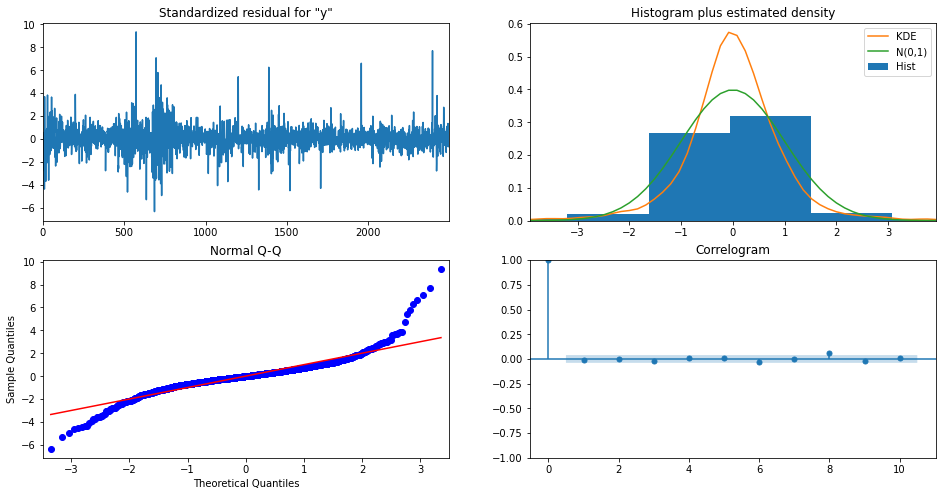

In [170]:
output.plot_diagnostics(figsize=(16, 8))
plt.show()

In [168]:
output.plt_predict()

AttributeError: 'SARIMAXResults' object has no attribute 'plt_predict'

## Conclusions

**The Random Walk Theory**

Random walk theory suggests that changes in stock prices have the same distribution and are independent of each other.

In short, random walk theory proclaims that stocks take a random and unpredictable path that makes all methods of predicting stock prices futile in the long run.

This theory is from a 1973 book called A Random Walk Down Wall Street proposes that even with the most sophisticated statistical tools, you could never predict things like and Enron scandal or a global pandemic.  

**The Mixed Portfolio** 

Also called an asset mix, I realized why investors talk so much about a mixed portfolio.  The idea is that you don't put all your eggs in one basket.  "The asset mix is the breakdown of all assets within a fund or portfolio. Broadly, assets can be assigned to one of the core asset classes: stocks, bonds, cash, and real estate. An asset mix breakdown helps investors understand the composition of a portfolio"

After doing even more research I found that investors like to use the ARIMA model the most for investing in stocks combined with the idea of a mixed portfolio.  ARIMA(or SARIMA) will best predict what the future of individual stocks *COULD POTENTIALLY* bring large return while combining with risk management.


https://www.investopedia.com/terms/r/randomwalktheory.asp#:~:text=Random%20walk%20theory%20suggests%20that,are%20independent%20of%20each%20other.&text=In%20short%2C%20random%20walk%20theory,futile%20in%20the%20long%20run.